In [1]:
import cv2
import numpy as np
import os
from removeFrame import removeFrame
import matplotlib.pyplot as plt

(0, 23990001.0)


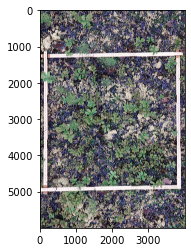

In [20]:
# Load image
img = cv2.imread('/Users/daniel/Desktop/ReindeerLichens/images/IMG_0174.JPG')

# Create grayscale image
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Blur the gray image

blur_gray = cv2.medianBlur(gray, 7)
sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(blur_gray, -1, sharpen_kernel)

# Threshold image
thresh = cv2.threshold(sharpen, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Create kernel used in the dilation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20,20))

# Dilate the thresholded image
dilate = cv2.dilate(thresh, kernel, iterations=3)

# # Fill holes 
# kernel2 = cv2.getStructuringElement(cv2.MORPH_ERODE,(100,100))
# res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)

# Find the contours in the image
contours = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]

# Loop through each area
area_list = []
for i,contour in enumerate(contours):
    area = cv2.contourArea(contour)
    area_list.append((i,area))

# Find maximum area
max_tuple = max(area_list, key=lambda tup: tup[1])

# Use boundingRect to find area within frame
x,y,w,h = cv2.boundingRect(contours[max_tuple[0]])

print(max_tuple)

# Area within frame
output = np.zeros((w,h))
output = img[y:y+h, x:x+w]


# # Repair image
# repair_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,50))
# new = cv2.morphologyEx(res, cv2.MORPH_CLOSE, repair_kernel, iterations=1)



# fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(30,30))
plt.imshow(output, cmap='gray')
# ax[1].imshow(new, cmap='gray')

In [9]:
print(contours[max_tuple[0]])

[[[   0    0]]

 [[   0 4936]]

 [[  50 4936]]

 [[  50 4935]]

 [[  52 4933]]

 [[  74 4933]]

 [[  75 4932]]

 [[  81 4932]]

 [[  82 4931]]

 [[ 104 4931]]

 [[ 105 4930]]

 [[ 151 4930]]

 [[ 152 4929]]

 [[ 177 4929]]

 [[ 178 4928]]

 [[ 252 4928]]

 [[ 253 4927]]

 [[ 271 4927]]

 [[ 272 4926]]

 [[ 277 4926]]

 [[ 278 4925]]

 [[ 280 4925]]

 [[ 280 4924]]

 [[ 282 4922]]

 [[ 284 4922]]

 [[ 285 4921]]

 [[ 286 4921]]

 [[ 287 4920]]

 [[ 290 4920]]

 [[ 290 4919]]

 [[ 291 4918]]

 [[ 302 4918]]

 [[ 303 4917]]

 [[ 329 4917]]

 [[ 330 4918]]

 [[ 330 4926]]

 [[ 400 4926]]

 [[ 401 4927]]

 [[ 401 4943]]

 [[ 399 4945]]

 [[ 398 4945]]

 [[ 396 4947]]

 [[ 396 4948]]

 [[ 395 4949]]

 [[ 326 4949]]

 [[ 326 4951]]

 [[ 325 4952]]

 [[ 325 4955]]

 [[ 324 4956]]

 [[ 324 4969]]

 [[ 323 4970]]

 [[ 321 4970]]

 [[ 320 4971]]

 [[ 303 4971]]

 [[ 302 4970]]

 [[ 295 4970]]

 [[ 294 4969]]

 [[ 282 4969]]

 [[ 280 4967]]

 [[ 145 4967]]

 [[ 144 4968]]

 [[ 122 4968]]

 [[ 121 

In [11]:
# Find the top 4 corners using the cv2.goodFeaturesToTrack()
corners = cv2.goodFeaturesToTrack(res,4,0.3,10)
corners = np.int0(corners)

# Iterate over the corners and draw a circle at that location
for i in corners:
    x,y = i.ravel()
    print(x,y)
    cv2.circle(res,(x,y),10,(0,0,255),-1)
    


3284 4883
2404 2313
57 1862
725 5066


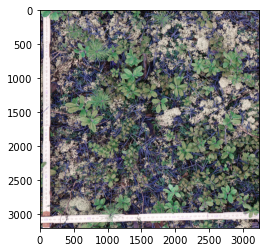

In [14]:
x,y,w,h = cv2.boundingRect(corners)

output = np.zeros((w,h))
output = img[y:y+h, x:x+w]

plt.imshow(output, cmap='gray')


In [16]:
'''Function that removes the frame in the image'''

# Load image
img = cv2.imread(image_path)

# Create grayscale image
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# GaussionBlur the gray image
kernel_size = 3
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

# Threshold image
thresh = cv2.threshold(blur_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Create kernel used in the dilation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))

# Dilate the thresholded image
dilate = cv2.dilate(thresh, kernel, iterations=3)

# Fill holes 
kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(150,150))
res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)

corners = cv2.goodFeaturesToTrack(res,4,0.3,10)
corners = np.int0(corners)

x,y,w,h = cv2.boundingRect(corners)


# Area within frame
output = np.zeros((w,h))
output = img[y:y+h, x:x+w]

NameError: name 'image_path' is not defined

In [4]:
img = 

[[[5591 3348]]

 [[ 784 3254]]

 [[5409 2025]]

 [[2686 1550]]]


In [ ]:
# Display the image
cv2.imshow('res',res)
cv2.waitKey()
cv2.destroyAllWindows()

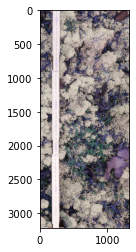

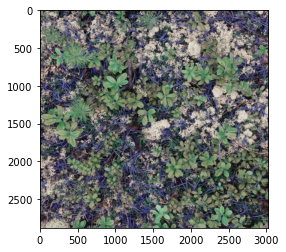

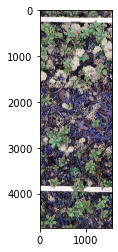

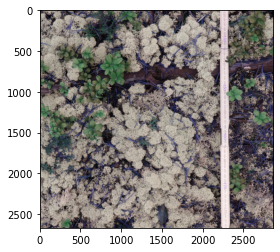

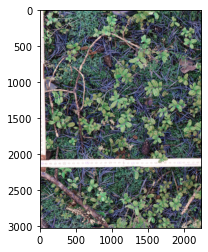

...

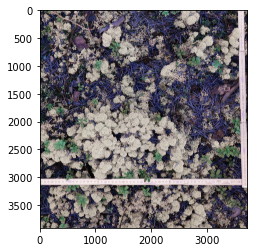

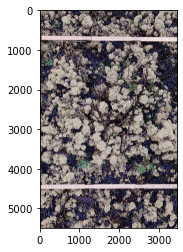

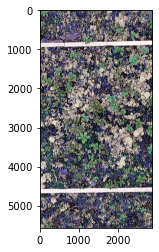

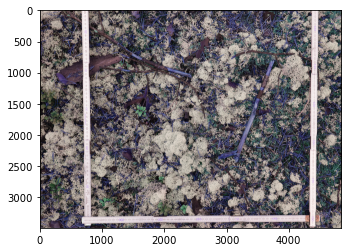

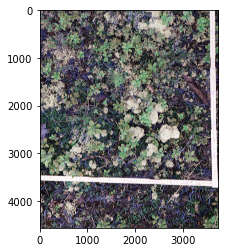

KeyboardInterrupt: 

In [19]:
for i, image in enumerate(os.listdir(os.getcwd()+'/images')):
    
    img = cv2.imread(os.getcwd()+'/images/'+image)

    # Create grayscale image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # GaussionBlur the gray image
    kernel_size = 3
    blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

    # Threshold image
    thresh = cv2.threshold(blur_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create kernel used in the dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))

    # Dilate the thresholded image
    dilate = cv2.dilate(thresh, kernel, iterations=3)

#     # Fill holes 
#     kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(150,150))
#     res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)

    corners = cv2.goodFeaturesToTrack(dilate,4,0.3,10)
    corners = np.int0(corners)

    x,y,w,h = cv2.boundingRect(corners)


    # Area within frame
    output = np.zeros((w,h))
    output = img[y:y+h, x:x+w]


    
    plt.imshow(output, cmap ='gray')
    plt.show()

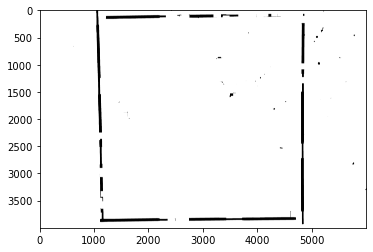

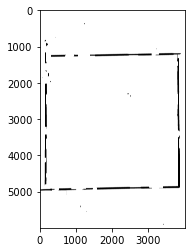

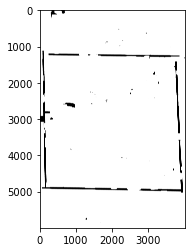

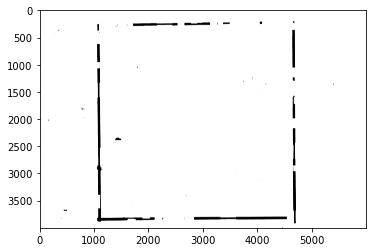

KeyboardInterrupt: 

In [45]:
for i, image in enumerate(os.listdir(os.getcwd()+'/images')):
    
    img = cv2.imread(os.getcwd()+'/images/'+image)
    
    # Create grayscale image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Blur the gray image

    blur_gray = cv2.medianBlur(gray, 7)
    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpen = cv2.filter2D(blur_gray, -1, sharpen_kernel)

    # Threshold image
    thresh = cv2.threshold(sharpen, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create kernel used in the dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20,20))

    # Dilate the thresholded image
    dilate = cv2.dilate(thresh, kernel, iterations=3)

    # Fill holes 
    kernel2 = cv2.getStructuringElement(cv2.MORPH_ERODE,(100,100))
    res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)


    
    plt.imshow(res, cmap ='gray')
    plt.show()

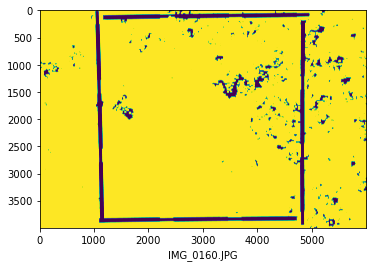

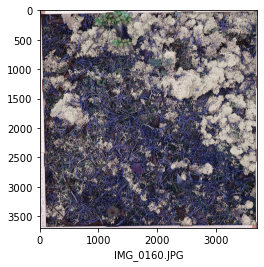

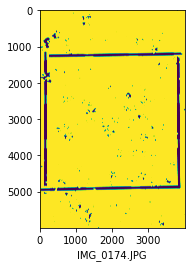

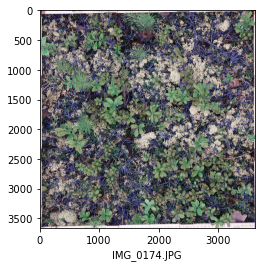

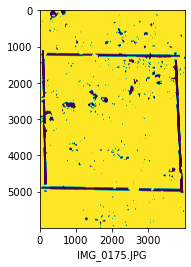

...

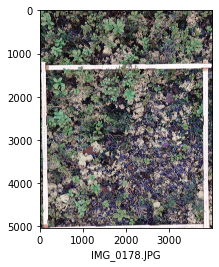

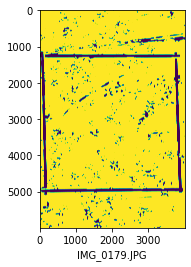

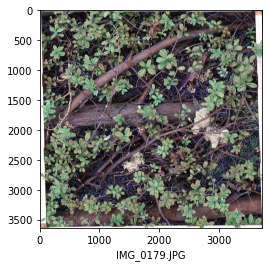

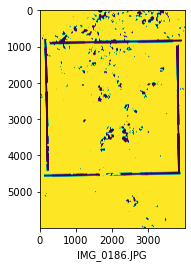

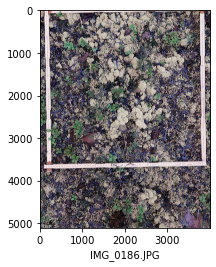

In [9]:
# Loop through image 
# fig, ax = plt.subplots(20,2, figsize=(100,100))

for i, image in enumerate(os.listdir(os.getcwd()+'/images')):
    
    
    # Load image
    img = cv2.imread(os.getcwd()+'/images/'+image)

    # Create grayscale image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # GaussionBlur the gray image
    kernel_size = 3
    blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

    # Threshold image
    thresh = cv2.threshold(blur_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create kernel used in the dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))

    # Dilate the thresholded image
    dilate = cv2.dilate(thresh, kernel, iterations=3)

    # Fill holes 
    kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(150,150))
    res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)

    # Find the contours in the image
    contours = cv2.findContours(res, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    # Loop through each area
    area_list = []
    for j,contour in enumerate(contours):
        area = cv2.contourArea(contour)
        area_list.append((j,area))

    # Find maximum area
    max_tuple = max(area_list, key=lambda tup: tup[1])

    # Use boundingRect to find area within frame
    x,y,w,h = cv2.boundingRect(contours[max_tuple[0]])

    # Area within frame
    output = np.zeros((w,h))
    output = img[y:y+h, x:x+w]

    plt.imshow(dilate)
    plt.xlabel(image)
    plt.show()
    
    plt.imshow(output)
    plt.xlabel(image)
    plt.show()

#     # Plot 
#     ax[i,0].imshow(dilate)
#     ax[i,0].set_xlabel(image+' dilated')
    
#     ax[i,1].imshow(output)
#     ax[i,1].set_xlabel(image)
    
#     if i == 19:
#         break
        
# plt.suptitle("Original versus without frame ", size=36)
# plt.show()

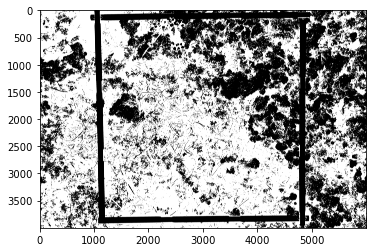

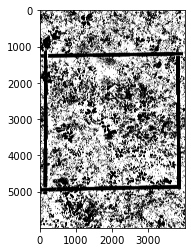

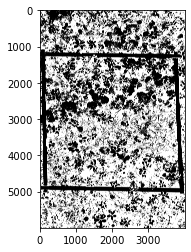

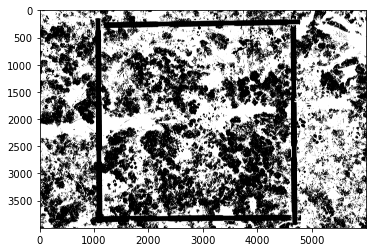

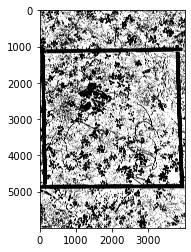

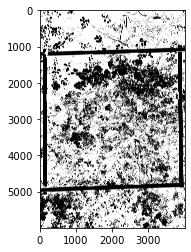

KeyboardInterrupt: 

In [28]:
for i, image in enumerate(os.listdir(os.getcwd()+'/images')):
    
    img = cv2.imread(os.getcwd()+'/images/'+image)
    
    
    # Create grayscale image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # GaussionBlur the gray image
    kernel_size = 3
    blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

    # Threshold image
    thresh = cv2.threshold(blur_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create kernel used in the dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))

    # Dilate the thresholded image
    dilate = cv2.dilate(thresh, kernel, iterations=3)
    
    

    # Fill holes 
#     kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(150,150))
#     res = cv2.morphologyEx(dilate,cv2.MORPH_OPEN,kernel2)

    corners = cv2.goodFeaturesToTrack(dilate,4,0.3,10)
    corners = np.int0(corners)

    x,y,w,h = cv2.boundingRect(corners)


    # Area within frame
    output = np.zeros((w,h))
    output = img[y:y+h, x:x+w]


    
    plt.imshow(thresh, cmap ='gray')
    plt.show()
    
#     plt.imshow(dilate, cmap='gray')
#     plt.show()

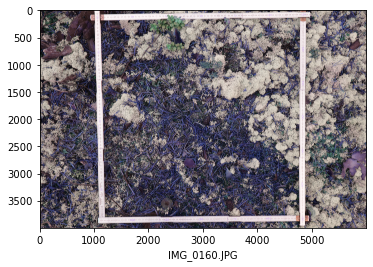

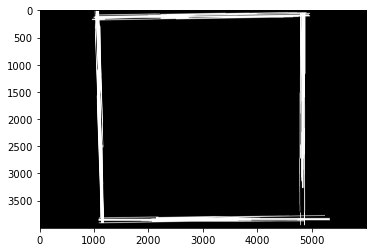

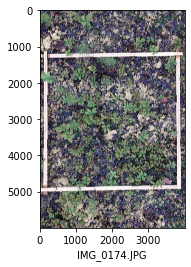

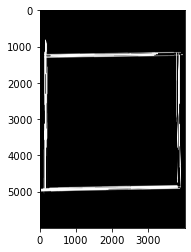

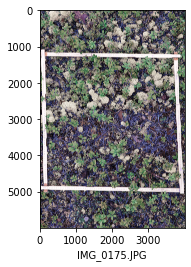

...

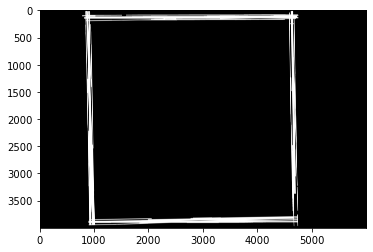

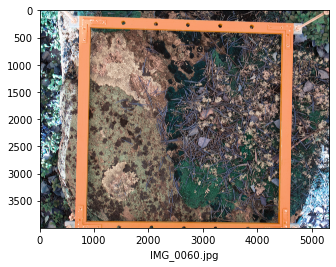

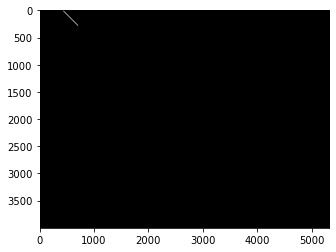

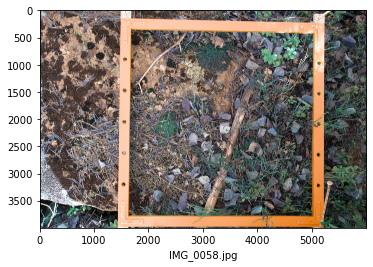

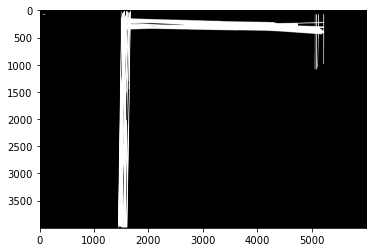

IndexError: tuple index out of range

In [11]:
for i, image in enumerate(os.listdir(os.getcwd()+'/tm')):
    
    img = cv2.imread(os.getcwd()+'/images/'+image)
    
        # Create grayscale image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)


    # Blur the gray image
    blur_gray = cv2.medianBlur(gray, 1)

    # Sharpen image
    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpen = cv2.filter2D(blur_gray, -1, sharpen_kernel)

    # Threshold image
    thresh = cv2.threshold(sharpen, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create kernel used in the dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20,20))

    # Dilate the thresholded image
    dilate = cv2.dilate(thresh, kernel, iterations=1)

    # plt.imshow(thresh, cmap='gray')
    # plt.show()

    # Extract edges
    edges = cv2.Canny(dilate,50,150,apertureSize = 3)

    # Extract lines
    lines = cv2.HoughLinesP(image=edges,rho=1,theta=np.pi/180, threshold=100,lines=np.array([]), minLineLength=10,maxLineGap=500)

    lines_out = np.zeros_like(gray)
    for i in range(np.shape(lines)[0]):
        cv2.line(lines_out, (lines[i][0][0], lines[i][0][1]), (lines[i][0][2], lines[i][0][3]), (255,255,255), 10, cv2.LINE_AA)


    plt.imshow(img)
    plt.xlabel(image)
    plt.show()
    plt.imshow(lines_out, cmap='gray')
    plt.show()